In [1]:
import cv2 as cv
import numpy as np

**Harris Corner Detector:**

This detector calculates a score for each pixel corresponding to given image, and defines a pixel to be a corner, if it's score is greater than a particular threshold. It considers a fixed size window around every pixel, and calculates determinant and trace of the intensity matrix corresponding to this window (which correlate with the eigen values and eigen vectors of this matrix - which define the directions of maximal and minimal change). The score is calculated by applying Harris operator. In below implementation, the threshold is defined based on the score values, i.e, the last 0.02% of the pixels whose scores are sorted in increasing order.

In [2]:
def harris_corner_detector(color_image, window_size, k=0.04, threshold_factor=0.998):
    image = cv.cvtColor(color_image, cv.COLOR_BGR2GRAY).astype(float) / 255
    h, w = image.shape
    d = window_size // 2
    # Intensity gradients - partial derivatives along X and y axes
    Ix, Iy = np.gradient(image)
    Ix_Ix = Ix ** 2
    Iy_Iy = Iy ** 2
    Ix_Iy = Ix * Iy
    all_pixels_and_scores = []
    for i in range(d, h - d):
        for j in range(d, w - d):
            # Sum of required intensities for all pixels in the window
            sum_xx = Ix_Ix[i - d: i + d + 1, j - d: j + d + 1].sum()
            sum_yy = Iy_Iy[i - d: i + d + 1, j - d: j + d + 1].sum()
            sum_xy = Ix_Iy[i - d: i + d + 1, j - d: j + d + 1].sum()
            det, trace = (sum_xx * sum_yy) - (sum_xy ** 2), sum_xx + sum_yy
            # Score based on determinant and trace of matrix 
            # (approximation of product and sum of eigen values respectively)
            R = det - (k * (trace ** 2))
            all_pixels_and_scores.append(tuple([R, i, j]))
    all_pixels_and_scores = sorted(all_pixels_and_scores)
    # Considering pixels with high scores as corners
    corners = all_pixels_and_scores[int(threshold_factor * len(all_pixels_and_scores)):]
    return corners

**Shi Thomasi Detector:**

This detector also calculates a score for each pixel corresponding to given image, and defines a pixel to be a corner, if it's score is greater than a particular threshold. It considers a fixed size window around every pixel, and calculates the eigen values of the intensity matrix corresponding to this window, and assigns the smaller eigen value as the score to each pixel (which indicates that the direction of least spread is also significant - indicating that current pixel is a corner). In below implementation, the threshold is defined based on the score values, i.e, the last 0.02% of the pixels whose scores are sorted in increasing order.

In [3]:
# Detects corners of a given image based on a threshold score (scores which lie in highest 2% by default)
def shi_thomasi_detector(color_image, window_size, threshold_factor=0.998):
    image = cv.cvtColor(color_image, cv.COLOR_BGR2GRAY).astype(float) / 255
    h, w = image.shape
    d = window_size // 2
    # Intensity gradients - partial derivatives along X and y axes
    Ix, Iy = np.gradient(image)
    Ix_Ix = Ix ** 2
    Iy_Iy = Iy ** 2
    Ix_Iy = Ix * Iy
    all_pixels_and_scores = []
    for i in range(d, h - d):
        for j in range(d, w - d):
            sum_xx = Ix_Ix[i - d: i + d + 1, j - d: j + d + 1].sum()
            sum_yy = Iy_Iy[i - d: i + d + 1, j - d: j + d + 1].sum()
            sum_xy = Ix_Iy[i - d: i + d + 1, j - d: j + d + 1].sum()
            # The A matrix for a fixed window around the pixel
            eigen_values, eigen_vectors = np.linalg.eig([[sum_xx, sum_xy], [sum_xy, sum_yy]])
            R = min(eigen_values)
            # Considering minimum variation (small eigen value) as score of the pixel
            all_pixels_and_scores.append(tuple([R, i, j]))
    all_pixels_and_scores = sorted(all_pixels_and_scores)
    # Considering pixels with high scores as corners
    corners = all_pixels_and_scores[int(threshold_factor * len(all_pixels_and_scores)):]
    return corners

In [4]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [5]:
from google.colab.patches import cv2_imshow

# Colour corner pixels in red 
def display_results(image_path, K, is_harris=True, file_name=''):
    image = cv.imread(image_path)
    if is_harris:
        corners = harris_corner_detector(image, K)
    else:
        corners = shi_thomasi_detector(image, K)
    for c in corners:
        r, i, j = c
        image[i, j] = (0, 0, 255)
    cv2_imshow(image)
    cv.imwrite(file_name, image)

In [6]:
def get_output(PATH):
    name = PATH.split('/')[-2]
    print(name + " Image")
    cv2_imshow(cv.imread(PATH))
    print("\n\n Harris Corner Detector -> Window size = 3\n\n")
    display_results(PATH, K=3, file_name=f'./results/{name}_Harris_3.png')
    print("\n\n Shi-Tomasi Detector -> Window size = 3\n\n")
    display_results(PATH, K=3, is_harris=False, file_name=f'./results/{name}_Shi-Tomasi_3.png')
    print("\n\n Harris Corner Detector -> Window size = 5\n\n")
    display_results(PATH, K=5, file_name=f'./results/{name}_Harris_5.png')
    print("\n\n Shi-Tomasi Detector -> Window size = 5\n\n")
    display_results(PATH, K=5, is_harris=False, file_name=f'./results/{name}_Shi-Tomasi_5.png')
    print("\n\n Harris Corner Detector -> Window size = 11\n\n")
    display_results(PATH, K=11, file_name=f'./results/{name}_Harris_11.png')
    print("\n\n Shi-Tomasi Detector -> Window size = 11\n\n")
    display_results(PATH, K=11, is_harris=False, file_name=f'./results/{name}_Shi-Tomasi_11.png')

In [7]:
PATHS = ['/content/gdrive/My Drive/cv-assign2/data/all-frames-colour/Grove3/frame10.png', 
         '/content/gdrive/My Drive/cv-assign2/data/all-frames-colour/RubberWhale/frame10.png',
         '/content/gdrive/My Drive/cv-assign2/data/all-frames-colour/Urban2/frame10.png']

Grove3 Image


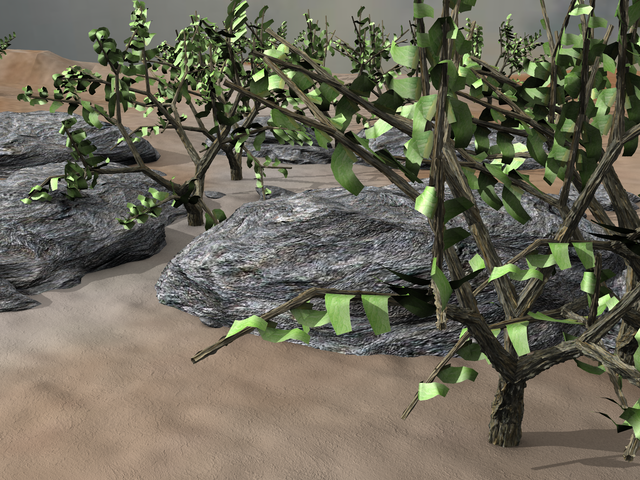



 Harris Corner Detector -> Window size = 3




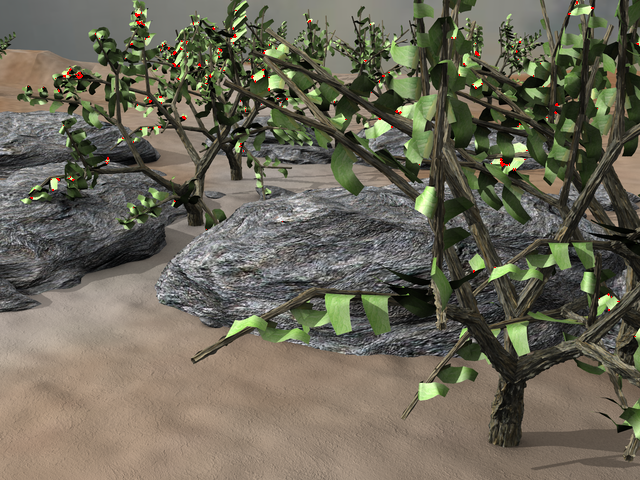



 Shi-Tomasi Detector -> Window size = 3




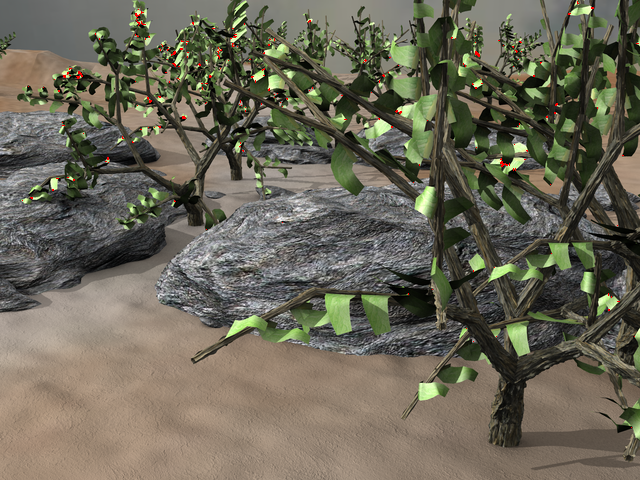



 Harris Corner Detector -> Window size = 5




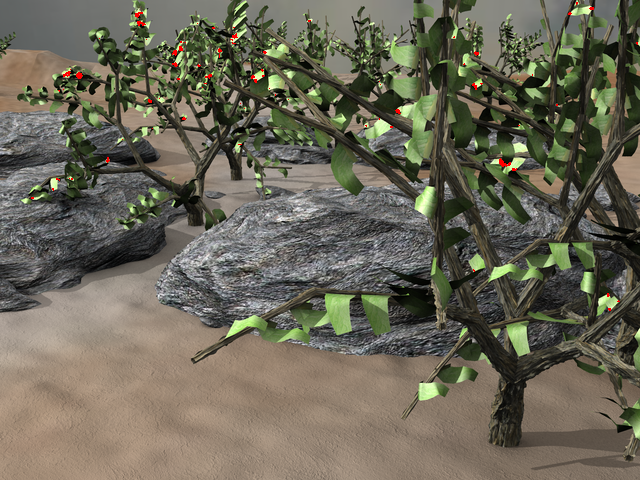



 Shi-Tomasi Detector -> Window size = 5




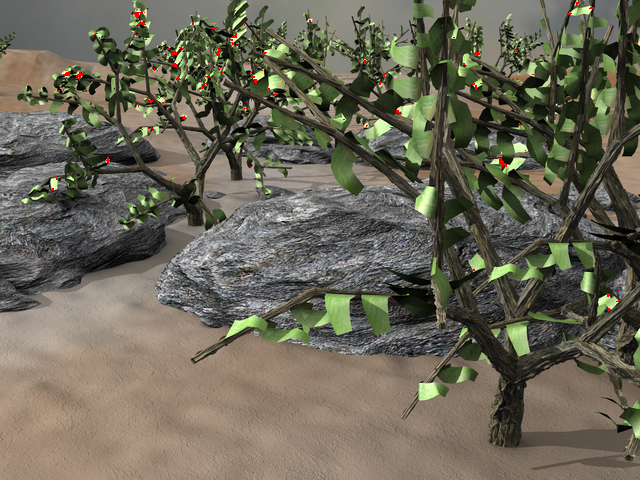



 Harris Corner Detector -> Window size = 11




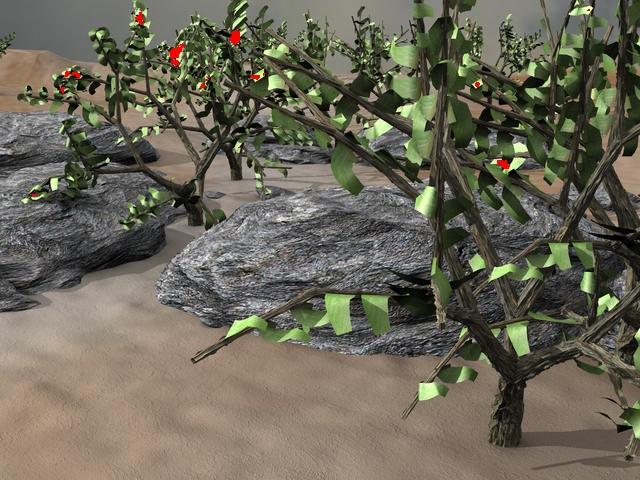



 Shi-Tomasi Detector -> Window size = 11




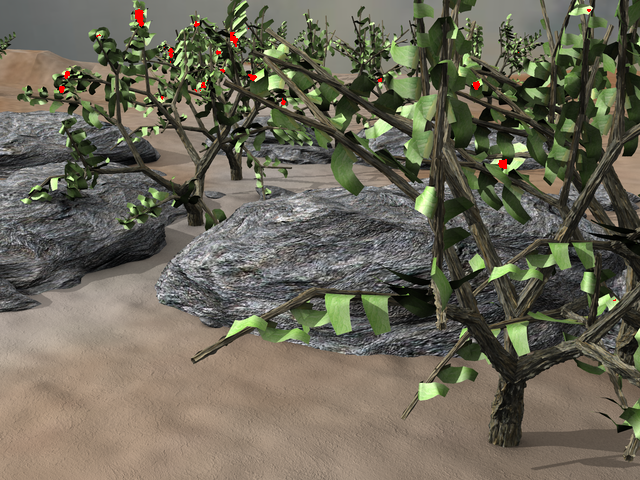

In [8]:
get_output(PATHS[0])

RubberWhale Image


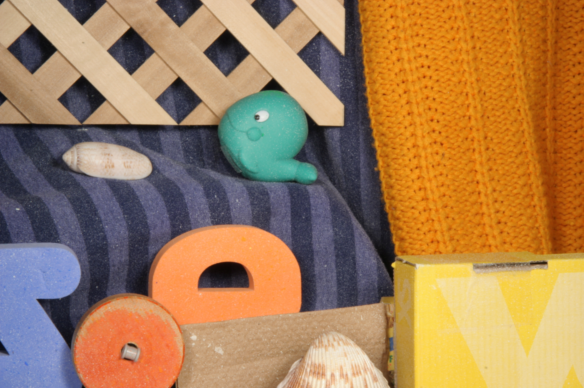



 Harris Corner Detector -> Window size = 3




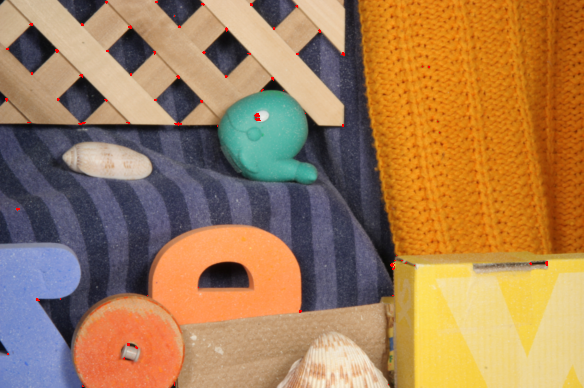



 Shi-Tomasi Detector -> Window size = 3




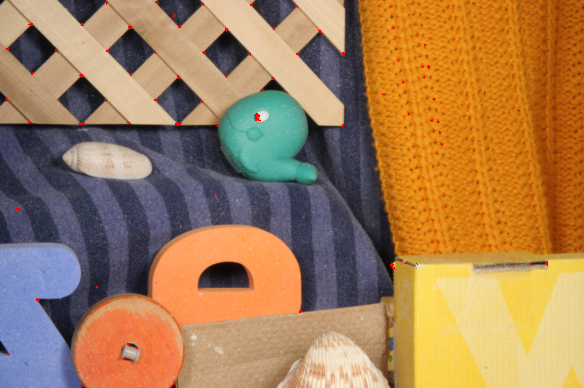



 Harris Corner Detector -> Window size = 5




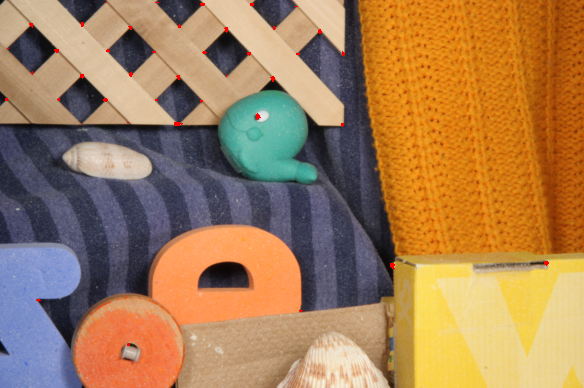



 Shi-Tomasi Detector -> Window size = 5




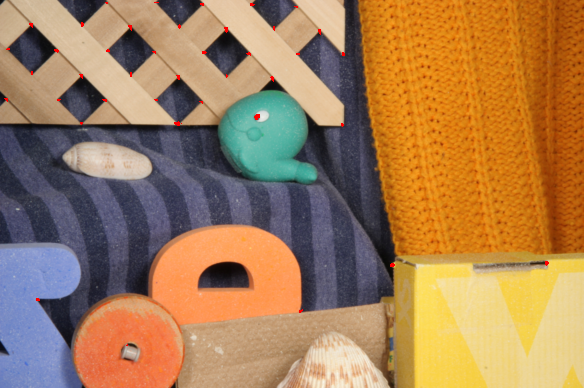



 Harris Corner Detector -> Window size = 11




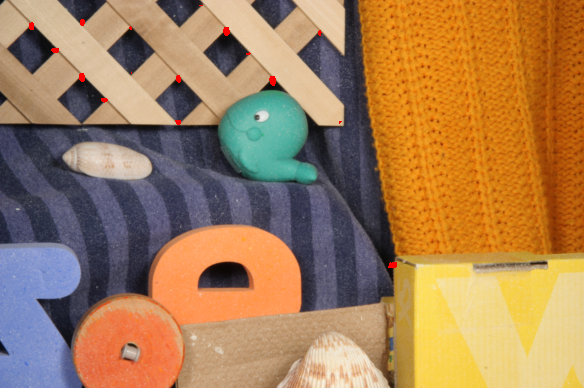



 Shi-Tomasi Detector -> Window size = 11




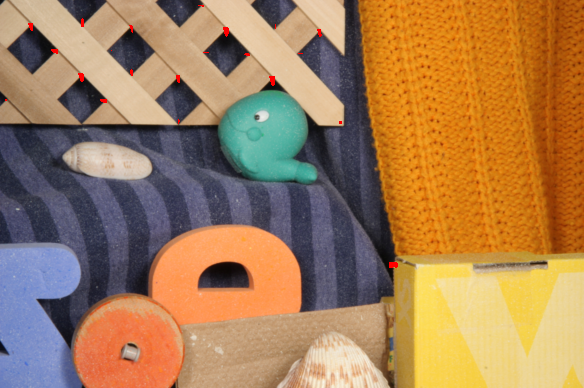

In [9]:
get_output(PATHS[1])

Urban2 Image


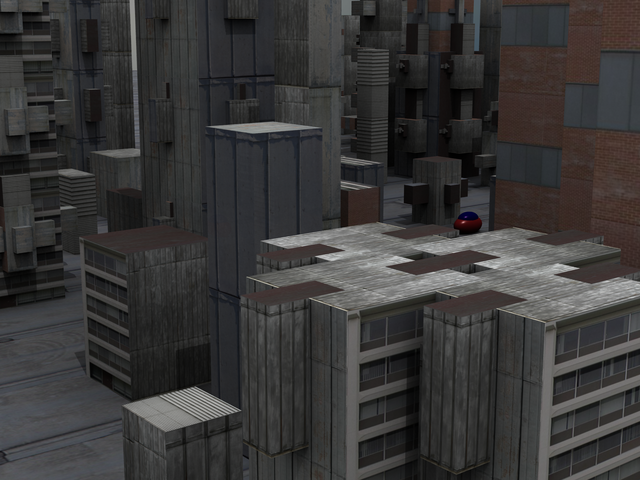



 Harris Corner Detector -> Window size = 3




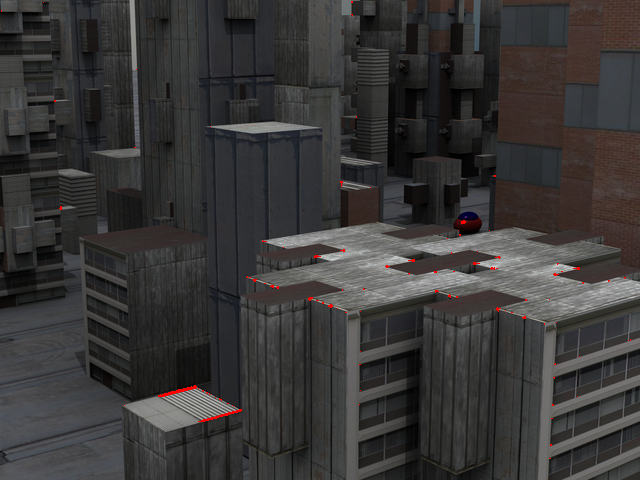



 Shi-Tomasi Detector -> Window size = 3




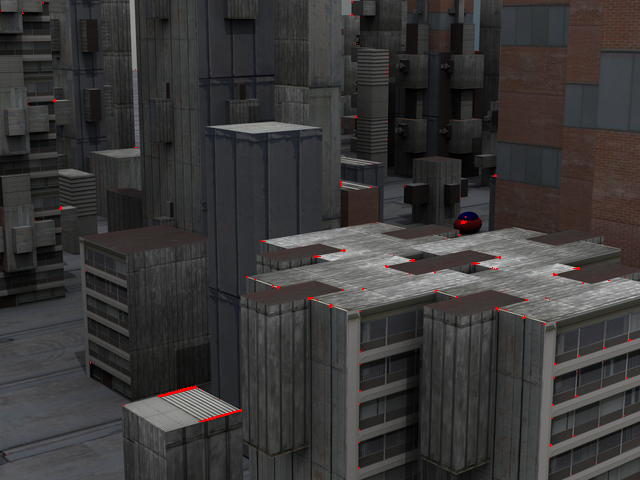



 Harris Corner Detector -> Window size = 5




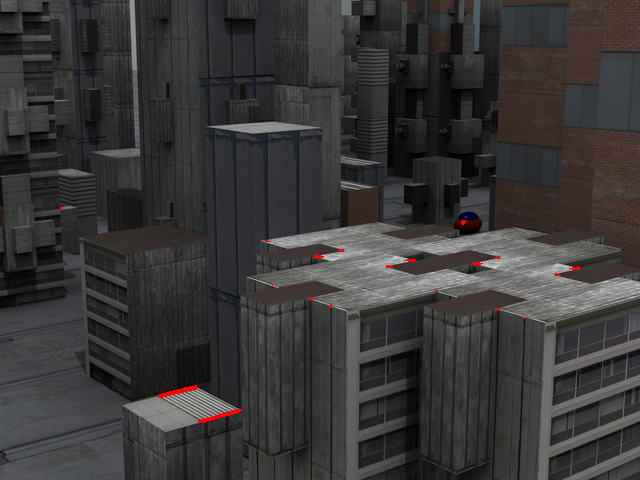



 Shi-Tomasi Detector -> Window size = 5




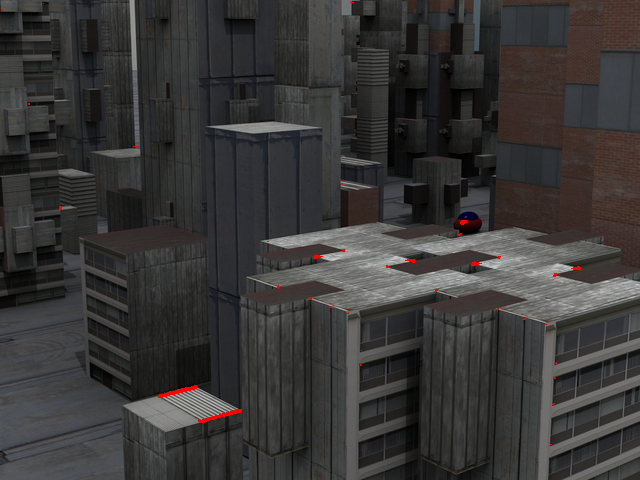



 Harris Corner Detector -> Window size = 11




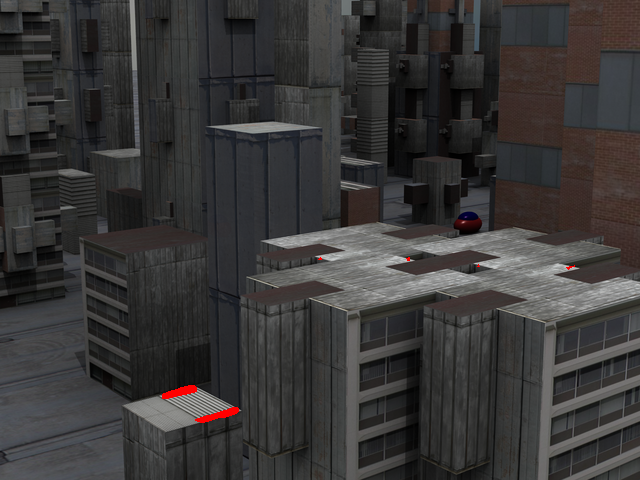



 Shi-Tomasi Detector -> Window size = 11




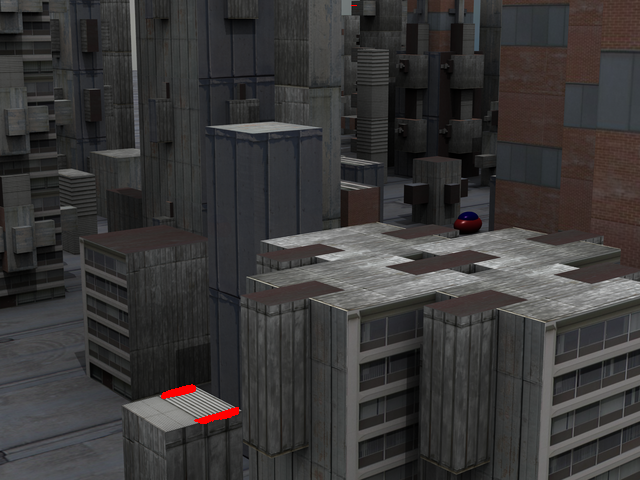

In [10]:
get_output(PATHS[2])

**Comparison**

We can observe that Shi-Thomasi and Harris Corner detector perform in a relatively similar manner. Although, Shi-Thomasi approach seems to perform a tad bit better, as it is able to detect more relevant corners in the image in comparison with Harris corner detector (few pointy ends of buildings, their windows etc.). This indicates that setting a threshold on the direction of least intensity variation (smaller eigen value) is indeed slightly more effective in corner detection.

**Window size**

Here, we can observe that Shi Thomasi detector identifies slightly more relevant corners than Harris corner detector. Although, clearly a lot of corners have gone undetected, due to the large window size which has affected non-maximal suppression to a significant extent, and led to clustered output of corners wherever detected.

In [11]:
!zip -r results.zip results

  adding: results/ (stored 0%)
  adding: results/Grove3_Shi-Tomasi_5.png (deflated 1%)
  adding: results/Grove3_Harris_3.png (deflated 1%)
  adding: results/RubberWhale_Shi-Tomasi_5.png (deflated 0%)
  adding: results/Urban2_Shi-Tomasi_5.png (deflated 2%)
  adding: results/RubberWhale_Shi-Tomasi_11.png (deflated 0%)
  adding: results/Grove3_Shi-Tomasi_11.png (deflated 1%)
  adding: results/Urban2_Harris_11.png (deflated 2%)
  adding: results/Grove3_Shi-Tomasi_3.png (deflated 1%)
  adding: results/RubberWhale_Shi-Tomasi_3.png (deflated 0%)
  adding: results/Urban2_Harris_5.png (deflated 2%)
  adding: results/Urban2_Shi-Tomasi_3.png (deflated 2%)
  adding: results/Urban2_Shi-Tomasi_11.png (deflated 2%)
  adding: results/Grove3_Harris_11.png (deflated 1%)
  adding: results/RubberWhale_Harris_5.png (deflated 0%)
  adding: results/Grove3_Harris_5.png (deflated 1%)
  adding: results/RubberWhale_Harris_11.png (deflated 0%)
  adding: results/RubberWhale_Harris_3.png (deflated 0%)
  adding: res

In [12]:
from google.colab import files
files.download("results.zip")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>